# Florian Goeman's AI Final Project - Transfer Learning
## Importing the needed Libraries

In [2]:
import io
from PIL import Image

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn

from huggingface_hub import notebook_login

from datasets import load_dataset, concatenate_datasets, DatasetDict

from transformers import AutoImageProcessor, ViTForImageClassification

from transformers import Trainer, TrainingArguments


import transformers
print(transformers.__version__)

import evaluate

4.52.4


## Log Into Huggingface
`Set-ExecutionPolicy -Scope Process -ExecutionPolicy Bypass` can be used with `huggingface-cli login` in case of issues when providing the Hugging Face access token.

In [5]:
notebook_login()

## Loading Dataset and display different splits

In [6]:
dataset = load_dataset('maurice-fp/stanford-dogs')
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 12000
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 8580
    })
})

#### The dataset contains the following features:

- `image`: A PIL image object in RGB mode, with a size of 500x301 pixels  
- `label`: An integer representing the class label for the dog breed

In [12]:
dataset['train'][0]

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x298>,
 'label': 0}

### Print of all the labels  
We retrieve all unique label IDs from the training set to confirm the number of distinct classes.  
This verifies that the dataset includes 120 dog breeds and prepares us for proper label mapping later on.

In [11]:
labels = dataset['train'].unique('label')
print(len(labels),labels)

120 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119]


## A display of randomly selected images

The ID has been replaced with the actual dog breed name for better readability.

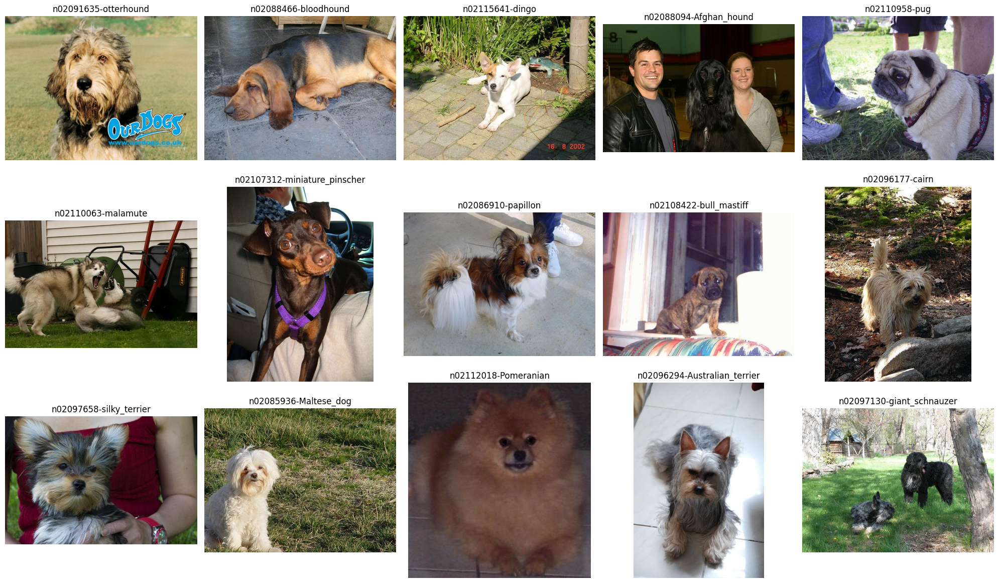

In [7]:
def show_samples(ds, rows, cols):
    samples = ds.shuffle().select(np.arange(rows*cols))
    fig = plt.figure(figsize=(cols*4, rows*4))

    class_names = ds.features['label'].names

    for i, sample in enumerate(samples):
        img = sample['image']
        label_id = sample['label']
        label_name = class_names[label_id]

        ax = fig.add_subplot(rows, cols, i+1)
        ax.imshow(img)
        ax.set_title(label_name)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

show_samples(dataset['train'], rows=3, cols=5)

## Preparing the dataset  
First, the train and test splits are concatenated in order to apply a custom split later on.

In [8]:
# Combine Datasets for different split
dataset = concatenate_datasets([dataset['test'], dataset['train']]);
dataset 

Dataset({
    features: ['image', 'label'],
    num_rows: 20580
})

### Splitting the dataset  
To maximize the amount of data used for training, the dataset is split into 80% training, 10% validation, and 10% test.  
This is done in two steps: first, 80% is allocated for training and 20% for evaluation. The evaluation portion is then evenly split into validation and test sets.

In [9]:
split_dataset = dataset.train_test_split(test_size=0.2) # 80% train, 20% evaluation
eval_dataset = split_dataset['test'].train_test_split(test_size=0.5) # 50% validation, 50% test

# recombining the splits using a DatasetDict

dataset = DatasetDict({
    'train': split_dataset['train'],
    'validation': eval_dataset['train'],
    'test': eval_dataset['test']
})

dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 16464
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 2058
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 2058
    })
})

### Creating label mappings  
As the next step, we create two dictionaries to map between the class labels and their corresponding integer IDs.  
This will be used later for model configuration and decoding predictions.

In [10]:
label2id = {c:idx for idx,c in enumerate(labels)}
id2label = {idx:c for idx,c in enumerate(labels)}

### Loading the pre-trained image processor  
As the next step, we load the pre-trained image processor for `google/vit-base-patch16-224`.  
This processor handles resizing, normalization, and other preprocessing needed for the model.

In [11]:
processor = AutoImageProcessor.from_pretrained('google/vit-base-patch16-224')
processor

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


ViTImageProcessor {
  "do_convert_rgb": null,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

### Defining data augmentation and preprocessing  
A set of image augmentations is applied to enhance training diversity, including cropping, flipping, and slight color adjustments.  
The `img_transform` function handles both the image processing and label mapping, preparing the data for model input.

In [12]:
from torchvision import transforms as the_transformer

image_augmentations = the_transformer.Compose([
    the_transformer.RandomResizedCrop(224),
    the_transformer.RandomHorizontalFlip(),
    the_transformer.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
])

def img_transform(batch):
    images = [image_augmentations(x.convert('RGB')) for x in batch['image']]

    inputs = processor(images, return_tensors='pt')

    inputs['labels'] = torch.tensor([label2id[y] for y in batch['label']])
    return inputs


### Applying the transformation to the dataset  
The `img_transform` function is attached to the dataset using `.with_transform()`, so it's automatically applied during data loading.

In [13]:
processed_dataset = dataset.with_transform(img_transform)

Now let's print the dataset again.

In [14]:
processed_dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 16464
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 2058
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 2058
    })
})

## Setting up the device and custom collation  
The computation device is selected automatically (GPU if available, otherwise CPU). A custom `collate_fn` is defined to batch image and label tensors and move them to the selected device.

In [15]:
# Try to send to GPU (CUDA on Windows)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Using device:", device)
if device.type == "cuda":
    print("CUDA available:", torch.cuda.is_available())
    print("Device name:", torch.cuda.get_device_name(0))

def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]).to(device),
        'labels': torch.tensor([x['labels'] for x in batch]).to(device)
    }

Using device: cpu


### Loading metric and defining accuracy function  
The accuracy metric is loaded using the `evaluate` library.  
The `compute_metrics` function calculates accuracy by comparing predicted class indices from logits to the true labels.

In [16]:
accuracy = evaluate.load('accuracy')
def compute_metrics(eval_preds):
    logits, labels = eval_preds
    predictions = np.argmax(logits,axis=1)
    score = accuracy.compute(predictions=predictions, references=labels)
    return score

## Loading the model  
We initialize `ViTForImageClassification` using pretrained weights from `google/vit-base-patch16-224` to take advantage of transfer learning.  
Since our dataset contains a different number of classes than the original model (ImageNet), we set `num_labels` accordingly and provide `id2label` and `label2id` mappings for correct interpretation during training and evaluation.  
The `ignore_mismatched_sizes=True` flag ensures the model still loads even though the classification head does not match in size — this replaces it with a new, randomly initialized head suited for our task.


In [17]:
model = ViTForImageClassification.from_pretrained(
    'google/vit-base-patch16-224',
    num_labels = len(labels),
    id2label = id2label,
    label2id = label2id,
    ignore_mismatched_sizes = True
)

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([120]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([120, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Inspecting the model architecture  
The structure of the `ViTForImageClassification` model is displayed to confirm its components.  
It includes patch embeddings, a stack of 12 transformer layers, and a classification head — now adjusted for our specific number of classes.

In [18]:
model

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=True)
            (intermed

### Freezing the base model  
To fine-tune only the classification layer, all other model parameters are frozen by setting `requires_grad = False`, except for those in the `classifier` layer.

In [19]:
for name,p in model.named_parameters():
    if not name.startswith('classifier'):
        p.requires_grad = False

### Verify parameter counts  
We check the total number of model parameters and confirm how many are trainable.  
In this case, only the classification head is trainable: 92,280 out of 85 million parameters.

In [52]:
num_params = sum([p.numel() for p in model.parameters()])
trainable_params = sum([p.numel() for p in model.parameters() if p.requires_grad])

print(f"{num_params = :,} | {trainable_params = :,}")

num_params = 85,890,936 | trainable_params = 92,280


## Start Training

### Defining training arguments  
We configure the training setup using `TrainingArguments`, specifying key parameters like batch size, learning rate, evaluation strategy, and logging.  
The goal is to train efficiently while regularly evaluating performance and saving the best model.  

The number of training epochs was reduced to 5 to allow for quicker experimentation and to encourage more stable, gradual convergence.

In [53]:
training_args = TrainingArguments(
    output_dir="./vit-base-maurice-fp-stanford-dogs",
    per_device_train_batch_size=16,
    eval_strategy="epoch",
    save_strategy="epoch",
    logging_steps=100,
    num_train_epochs=5,
    learning_rate=6e-5,
    weight_decay=0.01,
    warmup_ratio=0.1,
    save_total_limit=2,
    remove_unused_columns=False,
    push_to_hub=True,
    report_to='tensorboard',
    load_best_model_at_end=True,
    metric_for_best_model='accuracy',
    greater_is_better=True,
    run_name="vit-base-cub200-lr6e-5-augmented"
)

### Initializing the Trainer  
We set up the Hugging Face `Trainer` by passing in the model, training arguments, datasets, data collator, and evaluation function.  
The `processor` is used as the tokenizer, though a warning reminds us this argument will be deprecated in future versions.

In [54]:
trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=processed_dataset["train"],
    eval_dataset=processed_dataset["validation"],
    tokenizer=processor
)

/var/folders/7m/n3nzwb7d5kv8n2_m01gqwpt40000gq/T/ipykernel_68954/613752247.py:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


### Launching training  
With all components in place, training was executed on a GPU and completed in about 31 minutes.  
The model quickly improved after the first epoch, with accuracy jumping above 84%. However, progress leveled off in later epochs, showing only small changes.

#### Interpreting the outcome  
The sharp initial improvements suggest that the learning rate may have been too aggressive at the start. A gradual reduction — using a scheduler — might have supported better refinement.  
The slight drop in validation performance despite lower training loss hints at overfitting beginning to set in. This is common when the model starts to memorize rather than generalize.

In [55]:
trainer.train()

/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss,Accuracy
1,1.783900,1.649160,0.798834
2,0.765000,0.765462,0.841108
3,0.650400,0.655783,0.842566
4,0.605400,0.660111,0.831876
5,0.627900,0.613334,0.843537


/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not suppo

TrainOutput(global_step=5145, training_loss=1.2735631225407993, metrics={'train_runtime': 1010.1095, 'train_samples_per_second': 81.496, 'train_steps_per_second': 5.094, 'total_flos': 6.385887142953615e+18, 'train_loss': 1.2735631225407993, 'epoch': 5.0})

### Final evaluation on the test set  
After training, the model was evaluated on the held-out test set to measure generalization.  
It achieved an accuracy of **84.16%** with a test loss of **0.63**, confirming consistent performance across unseen data.

In [56]:
trainer.evaluate(processed_dataset['test'])

/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


{'eval_loss': 0.632305383682251,
 'eval_accuracy': 0.8415937803692906,
 'eval_runtime': 25.1438,
 'eval_samples_per_second': 81.849,
 'eval_steps_per_second': 10.261,
 'epoch': 5.0}

### Visualizing model predictions  
A grid of images from the test set is displayed along with their true and predicted labels.  
This helps assess how well the model performs visually and makes it easier to spot common misclassifications or confident predictions.

/Users/university/ZHAW/aiapplications/abschlussprojekt/env/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


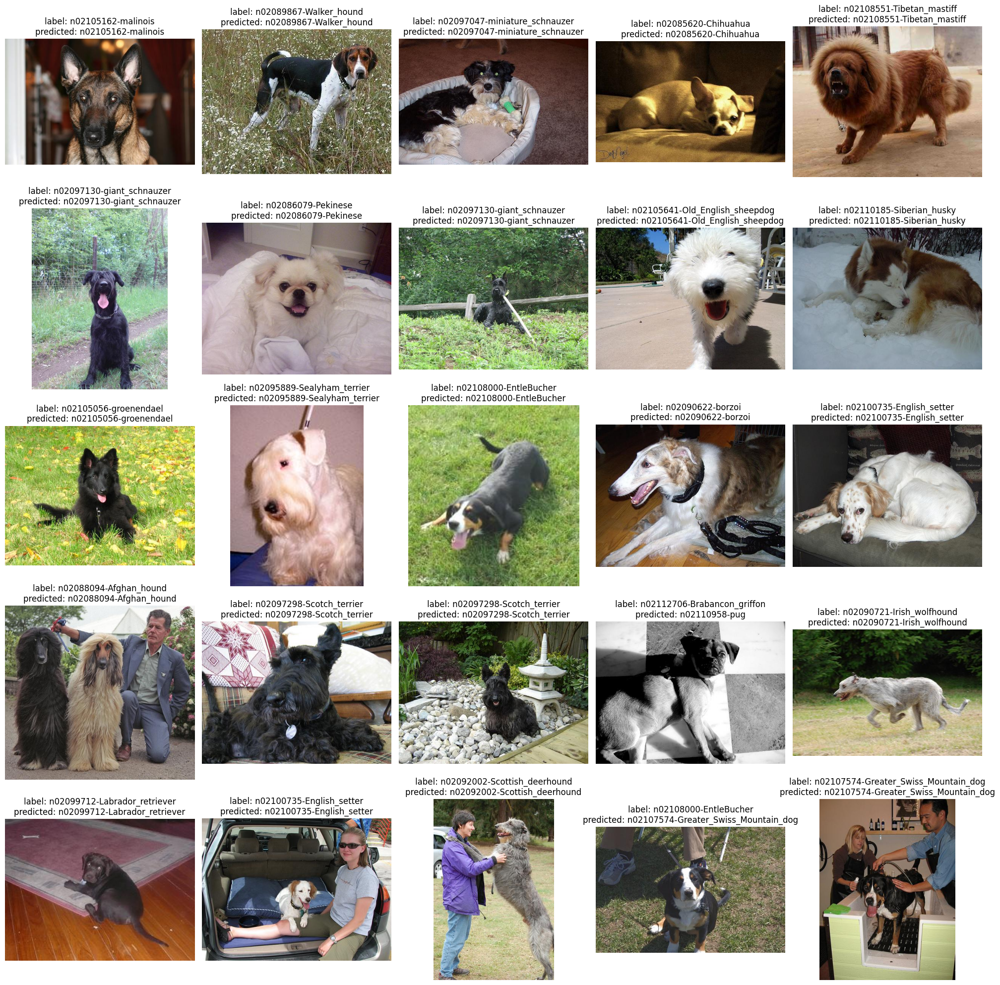

In [57]:
def show_predictions(rows, cols):
    samples = dataset['test'].shuffle().select(np.arange(rows * cols))
    processed_samples = samples.with_transform(img_transform)
    predictions = trainer.predict(processed_samples).predictions.argmax(axis=1)

    class_names = dataset['test'].features['label'].names

    fig = plt.figure(figsize=(cols * 4, rows * 4))
    for i in range(rows * cols):
        img = samples[i]['image']
        true_label_id = samples[i]['label']
        predicted_label_id = predictions[i]

        true_label = class_names[true_label_id]
        predicted_label = class_names[predicted_label_id]

        label = f"label: {true_label}\npredicted: {predicted_label}"

        ax = fig.add_subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.set_title(label)
        ax.axis('off')

    plt.tight_layout()
    plt.show()


show_predictions(rows=5,cols=5)

### Hugging Face Upload
As a final step, we make the configurations and upload it to Hugging Face.

In [58]:
kwargs = {
    "finetuned_from": model.config._name_or_path,
    "dataset": 'maurice-fp/stanford-dogs',
    "tasks": "image-classification",
    "tags": ['image-classification'],
}

In [ ]:
trainer.save_model()
trainer.push_to_hub('🐶🐾', **kwargs)

events.out.tfevents.1748644771.marcs-macbook-pro.home.68954.3:   0%|          | 0.00/411 [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/Flogoro/vit-base-maurice-fp-stanford-dogs/commit/fcdc0a8b63836ba0b46a305bdc2378af6ca08a00', commit_message='🦆🦅', commit_description='', oid='fcdc0a8b63836ba0b46a305bdc2378af6ca08a00', pr_url=None, repo_url=RepoUrl('https://huggingface.co/Flogoro/vit-base-maurice-fp-stanford-dogs', endpoint='https://huggingface.co', repo_type='model', repo_id='Flogoro/vit-base-maurice-fp-stanford-dogs'), pr_revision=None, pr_num=None)